### Auditory inspection

We will use IPython.display.Audio to play the audio files so we can inspect aurally.

In [1]:
import IPython.display as ipd
ipd.Audio('audio/456.wav')

### Visual inspection

We will load a sample from each class and visually inspect the data for any patterns. We will use librosa to load the audio file into an array then librosa.display and matplotlib to display the waveform.


In [2]:
# Load imports

import IPython.display as ipd
import librosa
import librosa.display
import matplotlib.pyplot as plt

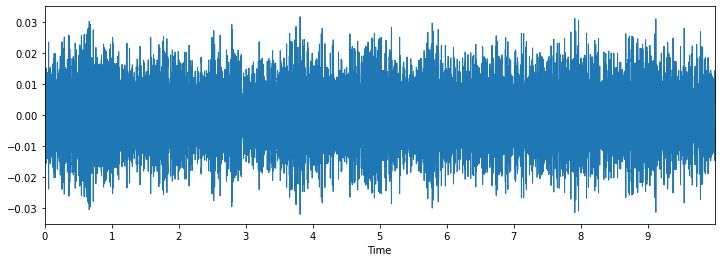

In [3]:
#Grocery Store

filename = 'audio/721.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

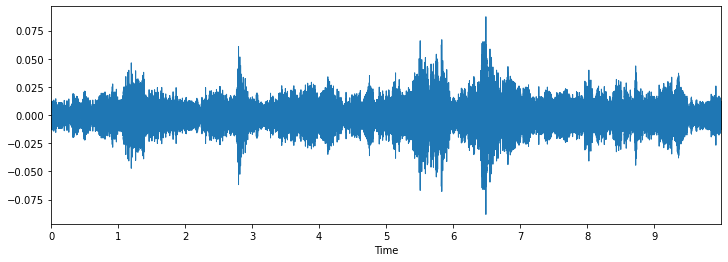

In [4]:
#Cafe/Restaurant

filename = 'audio/475.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

### Dataset Metadata

Here we will load the metadata .csv file into a Panda dataframe.


In [5]:
import pandas as pd
metadata = pd.read_csv('metadata.txt')
metadata.to_csv('metadata.csv', index = None) 
metadata.head()

,audio_name,category
0,1.wav,bus
1,10.wav,residential_area
2,100.wav,car
3,1000.wav,grocery_store
4,1001.wav,train


In [6]:
#Class Distibutions

print(metadata.category.value_counts())

forest_path         108
office              108
cafe/restaurant     108
park                108
car                 108
grocery_store       108
city_center         108
residential_area    108
metro_station       108
beach               108
library             108
bus                 108
tram                108
home                108
train               108
Name: category, dtype: int64


#### Extract Features

We will extract Mel-Frequency Cepstral Coefficients (MFCC) from the the audio samples.

The MFCC summarises the frequency distribution across the window size, so it is possible to analyse both the frequency and time characteristics of the sound. These audio representations will allow us to identify features for classification.


In [7]:
import librosa 
from scipy.io import wavfile as wav
import numpy as np

filename = 'audio/475.wav'

librosa_audio, librosa_sample_rate = librosa.load(filename) 

print('Librosa sample rate:', librosa_sample_rate)

Librosa sample rate: 22050


In [8]:
mfccs = librosa.feature.mfcc(y=librosa_audio, sr=librosa_sample_rate, n_mfcc=40)
print(mfccs.shape)

(40, 431)


This shows librosa calculated a series of 40 MFCCs over 431 frames. 

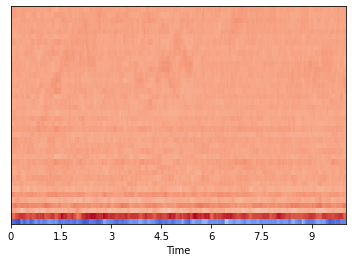

In [9]:
import librosa.display
librosa.display.specshow(mfccs, sr=librosa_sample_rate, x_axis='time')

#### Extracting MFCC's for every file 

We will now extract an MFCC for each audio file in the dataset and store it in a Panda Dataframe along with it's classification label. 

In [10]:
def extract_features(file_name):
   
    try:
        audio, sample_rate = librosa.load(file_name, res_type='kaiser_fast') 
        mfccs = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40)
        mfccsscaled = np.mean(mfccs.T,axis=0)
        
    except Exception as e:
        print("Error encountered while parsing file: ", file)
        return None 
     
    return mfccsscaled

In [11]:
# Load various imports 
import pandas as pd
import os
import librosa

# Set the path to the dataset 
fulldatasetpath = 'audio/'

metadata = pd.read_csv('metadata.csv')

features = []

# Iterate through each sound file and extract the features 
for index, row in metadata.iterrows():
    file_name = fulldatasetpath+str(row["audio_name"])
    
    class_label = row["category"]
    data = extract_features(file_name)
    
    features.append([data, class_label])

# Convert into a Panda dataframe 
featuresdf = pd.DataFrame(features, columns=['feature','class_label'])

print('Finished feature extraction from ', len(featuresdf), ' files') 

Finished feature extraction from  1620  files


### Convert the data and labels

We will use sklearn.preprocessing.LabelEncoder to encode the categorical text data into model-understandable numerical data.


In [12]:
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical

# Convert features and corresponding classification labels into numpy arrays
X = np.array(featuresdf.feature.tolist())
y = np.array(featuresdf.class_label.tolist())

# Encode the classification labels
le = LabelEncoder()
yy = to_categorical(le.fit_transform(y)) 

Using TensorFlow backend.


### Split the dataset

Here we will use sklearn.model_selection.train_test_split to split the dataset into training and testing sets. The testing set size will be 20% and we will set a random state.


In [13]:
# split the dataset 
from sklearn.model_selection import train_test_split 

x_train, x_test, y_train, y_test = train_test_split(X, yy, test_size=0.2, random_state = 42)

### Store the preprocessed data

In [14]:
# store the preprocessed data for use in the next notebook

%store x_train 
%store x_test 
%store y_train 
%store y_test 
%store yy 
%store le

Stored 'x_train' (ndarray)
Stored 'x_test' (ndarray)
Stored 'y_train' (ndarray)
Stored 'y_test' (ndarray)
Stored 'yy' (ndarray)
Stored 'le' (LabelEncoder)


In [15]:
# retrieve the preprocessed data from previous notebook

%store -r x_train 
%store -r x_test 
%store -r y_train 
%store -r y_test 
%store -r yy 
%store -r le

### Initial model architecture - MLP

We will start with constructing a Multilayer Perceptron (MLP) Neural Network using Keras and a Tensorflow backend.

Starting with a sequential model so we can build the model layer by layer.

We will begin with a simple model architecture, consisting of three layers, an input layer, a hidden layer and an output layer. All three layers will be of the dense layer type which is a standard layer type that is used in many cases for neural networks.

The first layer will receive the input shape. As each sample contains 40 MFCCs (or columns) we have a shape of (1x40) this means we will start with an input shape of 40.

The first two layers will have 256 nodes. The activation function we will be using for our first 2 layers is the ReLU, or Rectified Linear Activation. This activation function has been proven to work well in neural networks.

We will also apply a Dropout value of 50% on our first two layers. This will randomly exclude nodes from each update cycle which in turn results in a network that is capable of better generalisation and is less likely to overfit the training data.

Our output layer will have 15 nodes (num_labels) which matches the number of possible classifications. The activation is for our output layer is softmax. Softmax makes the output sum up to 1 so the output can be interpreted as probabilities. The model will then make its prediction based on which option has the highest probability.


In [16]:
import numpy as np
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Convolution2D, MaxPooling2D
from keras.optimizers import Adam
from keras.utils import np_utils
from sklearn import metrics 

num_labels = yy.shape[1]
filter_size = 2

# Construct model 
model = Sequential()

model.add(Dense(256, input_shape=(40,)))
model.add(Activation('relu'))
model.add(Dropout(0.5))

model.add(Dense(256))
model.add(Activation('relu'))
model.add(Dropout(0.5))

model.add(Dense(num_labels))
model.add(Activation('softmax'))

### Compiling the model

For compiling our model, we will use the following three parameters:

    Loss function - we will use categorical_crossentropy. This is the most common choice for classification. A lower score indicates that the model is performing better.

    Metrics - we will use the accuracy metric which will allow us to view the accuracy score on the validation data when we train the model.

    Optimizer - here we will use adam which is a generally good optimizer for many use cases.



In [17]:
# Compile the model
model.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer='adam') 

In [18]:
# Display model architecture summary 
model.summary()

# Calculate pre-training accuracy 
score = model.evaluate(x_test, y_test, verbose=0)
accuracy = 100*score[1]

print("Pre-training accuracy: %.4f%%" % accuracy)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 256)               10496     
_________________________________________________________________
activation_1 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 256)               65792     
_________________________________________________________________
activation_2 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 15)                3855      
__________

### Training

Here we will train the model.

We will start with 100 epochs which is the number of times the model will cycle through the data. The model will improve on each cycle until it reaches a certain point.

We will also start with a low batch size, as having a large batch size can reduce the generalisation ability of the model.


In [19]:
from keras.callbacks import ModelCheckpoint 
from datetime import datetime 

num_epochs = 100
num_batch_size = 20

checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.basic_mlp.hdf5', 
                               verbose=1, save_best_only=True)
start = datetime.now()

model.fit(x_train, y_train, batch_size=num_batch_size, epochs=num_epochs, validation_data=(x_test, y_test), callbacks=[checkpointer], verbose=1)


duration = datetime.now() - start
print("Training completed in time: ", duration)

Train on 1296 samples, validate on 324 samples
Epoch 1/100
1296/1296 [==============================] - 0s 313us/step - loss: 14.7344 - acc: 0.0694 - val_loss: 14.5380 - val_acc: 0.0679

Epoch 00001: val_loss improved from inf to 14.53802, saving model to saved_models/weights.best.basic_mlp.hdf5
Epoch 2/100
1296/1296 [==============================] - 0s 212us/step - loss: 14.5901 - acc: 0.0810 - val_loss: 13.7422 - val_acc: 0.1111

Epoch 00002: val_loss improved from 14.53802 to 13.74225, saving model to saved_models/weights.best.basic_mlp.hdf5
Epoch 3/100
1296/1296 [==============================] - 0s 235us/step - loss: 14.5119 - acc: 0.0864 - val_loss: 13.9139 - val_acc: 0.1235

Epoch 00003: val_loss did not improve from 13.74225
Epoch 4/100
1296/1296 [==============================] - 0s 221us/step - loss: 14.2671 - acc: 0.1049 - val_loss: 14.6113 - val_acc: 0.0864

Epoch 00004: val_loss did not improve from 13.74225
Epoch 5/100
1296/1296 [==============================] - 0s 208u


Epoch 00036: val_loss did not improve from 0.82519
Epoch 37/100
1296/1296 [==============================] - 0s 229us/step - loss: 1.2743 - acc: 0.5748 - val_loss: 0.7830 - val_acc: 0.8025

Epoch 00037: val_loss improved from 0.82519 to 0.78300, saving model to saved_models/weights.best.basic_mlp.hdf5
Epoch 38/100
1296/1296 [==============================] - 0s 222us/step - loss: 1.1906 - acc: 0.5887 - val_loss: 0.7716 - val_acc: 0.7809

Epoch 00038: val_loss improved from 0.78300 to 0.77165, saving model to saved_models/weights.best.basic_mlp.hdf5
Epoch 39/100
1296/1296 [==============================] - 0s 221us/step - loss: 1.0746 - acc: 0.6520 - val_loss: 0.6676 - val_acc: 0.7870

Epoch 00039: val_loss improved from 0.77165 to 0.66759, saving model to saved_models/weights.best.basic_mlp.hdf5
Epoch 40/100
1296/1296 [==============================] - 0s 227us/step - loss: 1.0624 - acc: 0.6520 - val_loss: 0.7272 - val_acc: 0.7654

Epoch 00040: val_loss did not improve from 0.66759
Ep

1296/1296 [==============================] - 0s 242us/step - loss: 0.5689 - acc: 0.8040 - val_loss: 0.3127 - val_acc: 0.9228

Epoch 00074: val_loss improved from 0.31350 to 0.31267, saving model to saved_models/weights.best.basic_mlp.hdf5
Epoch 75/100
1296/1296 [==============================] - 0s 236us/step - loss: 0.5679 - acc: 0.8086 - val_loss: 0.2791 - val_acc: 0.9228

Epoch 00075: val_loss improved from 0.31267 to 0.27911, saving model to saved_models/weights.best.basic_mlp.hdf5
Epoch 76/100
1296/1296 [==============================] - 0s 259us/step - loss: 0.5604 - acc: 0.8048 - val_loss: 0.2877 - val_acc: 0.9198

Epoch 00076: val_loss did not improve from 0.27911
Epoch 77/100
1296/1296 [==============================] - 0s 241us/step - loss: 0.5493 - acc: 0.8133 - val_loss: 0.2884 - val_acc: 0.9105

Epoch 00077: val_loss did not improve from 0.27911
Epoch 78/100
1296/1296 [==============================] - 0s 234us/step - loss: 0.5693 - acc: 0.8056 - val_loss: 0.3080 - val_acc

### Test the model

Here we will review the accuracy of the model on both the training and test data sets.


In [20]:
# Evaluating the model on the training and testing set
score = model.evaluate(x_train, y_train, verbose=0)
print("Training Accuracy: ", score[1])

score = model.evaluate(x_test, y_test, verbose=0)
print("Testing Accuracy: ", score[1])

Training Accuracy:  0.9621913580246914
Testing Accuracy:  0.9351851851851852


### Testing the model on Imaginal Narrative

Now, we will check what output we get for 